![](https://github.com/quarcs-lab/project2021o-notebook/blob/main/figs/cover.png?raw=true)

```
https://shorturl.at/evEFS
```
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/quarcs-lab/project2021o-notebook/blob/main/notebookColab.ipynb)

# **A geocomputational notebook to monitor regional development in Bolivia**

Carlos Mendez (Nagoya Univerisity), Erick Gonzales (United Nations), Lykke Andersen (SDSN Bolivia)


[![DOI](https://zenodo.org/badge/683583423.svg)](https://zenodo.org/badge/latestdoi/683583423)
```
Suggested citation:
Mendez, C., Gonzales, E., & Andersen, L. (2023). A geocomputational notebook to monitor regional development in Bolivia. Zenodo. https://doi.org/10.5281/zenodo.828685
```
Github repository: https://github.com/quarcs-lab/project2021o-notebook

## 1) Setup

In [307]:
# Adding necessary libraries to Google Colab environment

# Installing the 'contextily' library for adding basemaps to plots
!pip install contextily -q

# Installing the 'splot' library for spatial data visualization
!pip install splot -q

# Installing the 'inequality' library for inequality analysis
!pip install inequality -q

# Installing the 'mgwr' library for performing geographically weighted regression
!pip install mgwr -q


In [308]:
# Importing necessary libraries for data analysis and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px
import plotly.graph_objects as go

# Importing libraries for spatial data and visualization
import geopandas as gpd
import contextily as cx

import libpysal
from libpysal  import weights
from libpysal.weights import Queen

# Exploratory Spatial Data Analysis (ESDA) tools
import esda
from esda.moran import Moran, Moran_Local

# Spatial plotting tools
import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster, plot_local_autocorrelation
from splot.libpysal import plot_spatial_weights
from splot.mapping import vba_choropleth

# Library for inequality analysis
import inequality
from inequality.gini import Gini_Spatial

# Statistical modeling
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Geographically Weighted Regression (GWR) and related utilities
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import shift_colormap, truncate_colormap

# Suppressing warnings for cleaner output
import warnings
warnings.filterwarnings('ignore')


## 2) Import data

In [437]:
dataURL = 'https://github.com/quarcs-lab/project2021o-notebook/raw/main/map_and_data.geojson'
gdf = gpd.read_file(dataURL)

In [449]:
# Exploring data using the explore() function on the GeoDataFrame
gdf.explore(
    column='dep',                        # Column to visualize
    tooltip=['dep', 'mun', 'imds', 'rank_imds'],  # Information in tooltip
    categorical=True,                    # Categorical column
    legend=True,                         # Show legend
    tiles='CartoDB positron',            # Basemap style (Other options: CartoDB positron, OpenStreetMap, Stamen Terrain)
    style_kwds=dict(color="gray", weight=0.6),  # Styling for non-highlighted areas
    legend_kwds=dict(colorbar=False)     # Customize legend
)


In [438]:
gdf.head(3)

,asdf_id,shapeName,COORD_X,COORD_Y,poly_id,mun,mun_id,dep,dep_id,dep_mun,...,co2018,co2019,co2020,tr400_co2015,tr400_co2016,tr400_co2017,tr400_co2018,tr400_co2019,tr400_co2020,geometry
0,0,Esmeralda,-68.086369,-18.945744,178,Esmeralda,40505,Oruro,5,Oruro-Esmeralda,...,406.84192,408.98264,410.99747,400.56021,402.63989,404.73074,406.83206,408.94409,411.06708,"MULTIPOLYGON (((-68.26703 -18.81616, -68.23937..."
1,1,Santuario de Quillacas,-66.813557,-19.318918,169,Quillacas,40202,Oruro,5,Oruro-Quillacas,...,406.64880,408.32587,410.74161,399.42441,401.71268,404.01230,406.32236,408.64389,410.97791,"MULTIPOLYGON (((-66.50208 -19.35990, -66.56355..."
2,2,Pampa Aullagas,-67.165981,-19.231799,185,Pampa Aullagas,40802,Oruro,5,Oruro-Pampa Aullagas,...,405.79669,409.45132,410.87640,398.97784,401.38046,403.79791,406.23071,408.67877,411.14096,"MULTIPOLYGON (((-67.01372 -19.19540, -67.01520..."


In [439]:
dataDefinitions = pd.read_csv('https://raw.githubusercontent.com/quarcs-lab/project2021o-notebook/main/dataDefinitions.csv')
dataDefinitions

,Variable,Label
0,poly_id,Polygon ID
1,asdf_id,ASDF ID
2,mun,Municipality
3,mun_id,Municipality ID
4,dep,Department
...,...,...
134,tr400_co2016,Trend estimated carbon dioxide in 2016
135,tr400_co2017,Trend estimated carbon dioxide in 2017
136,tr400_co2018,Trend estimated carbon dioxide in 2018
137,tr400_co2019,Trend estimated carbon dioxide in 2019


In [460]:
data_dict = dict(zip(dataDefinitions['Variable'], dataDefinitions['Label']))

## 3) Select key indicators

In [440]:
INDICATOR1 = 'imds'

In [441]:
INDICATOR2 = 'pop2017'

In [442]:
INDICATOR3 = 'ln_t400NTLpc2017'

In [443]:
INDICATOR4 = 'co2017'

In [444]:
gdf[['mun', 'dep', INDICATOR1, INDICATOR2, INDICATOR3, INDICATOR4]].sort_values(by=INDICATOR1, ascending=False).reset_index(drop=True)

,mun,dep,imds,pop2017,ln_t400NTLpc2017,co2017
0,La Paz,La Paz,80.199997,772462.310,14.837066,404.19455
1,Cochabamba,Cochabamba,73.699997,673213.690,15.359578,401.71362
2,Tarija,Tarija,70.599998,230727.580,15.051453,403.31229
3,Quillacollo,Cochabamba,69.800003,157636.030,15.560627,402.02582
4,Sucre,Chuquisaca,69.599998,274544.380,15.081096,402.25317
...,...,...,...,...,...,...
334,Tacobamba,Potosí,37.200001,12940.568,12.519676,401.21509
335,San Pedro,Pando,36.400002,5143.437,12.530486,404.88699
336,Tinguipaya,Potosí,36.400002,28534.002,11.127213,402.61261
337,San Pedro de Buena Vista,Potosí,36.299999,32869.309,12.255042,402.96652


## 4) Exploratory data analysis (EDA)

### 4.1) Descriptive statistics

- What do we know about the centrality and dispersion of our development indicator?

In [389]:
gdf[[INDICATOR1, INDICATOR2, INDICATOR3, INDICATOR4]].describe().round(2)

,imds,pop2017,ln_t400NTLpc2017,co2017
count,339.00,339.00,339.00,339.00
mean,51.05,32858.76,13.67,403.59
std,6.77,117649.33,1.28,1.23
min,35.70,661.82,7.87,400.05
25%,47.00,6425.71,12.82,402.91
50%,50.50,11627.51,13.70,403.67
75%,54.85,22497.26,14.65,404.56
max,80.20,1604457.50,16.99,406.23


In [390]:
gdf[['dep', INDICATOR1]].groupby('dep').describe().round(2)

imds                                              
           count   mean   std   min    25%    50%    75%   max
dep                                                           
Beni        19.0  50.47  4.50  43.9  47.00  51.00  52.90  61.3
Chuquisaca  29.0  47.80  6.60  35.7  44.10  47.50  50.80  69.6
Cochabamba  47.0  52.50  8.50  39.4  46.30  52.00  57.20  73.7
La Paz      87.0  50.98  5.37  41.8  47.45  50.50  53.05  80.2
Oruro       35.0  50.68  5.03  42.9  47.15  50.00  53.00  67.4
Pando       15.0  45.43  5.59  36.4  41.40  46.00  48.40  57.1
Potosí      40.0  47.40  7.55  36.3  40.90  47.55  51.70  66.2
Santa Cruz  56.0  54.29  4.80  42.7  51.52  54.20  57.73  64.1
Tarija      11.0  60.60  5.50  51.8  57.45  59.50  63.45  70.6

### 4.2) Regional development differences

- How is our development indicator disbributed across the 339 municipalities and 9 departments of Bolivia?

In [468]:
# Creating a strip plot using Plotly Express
px.strip(
    gdf,
    x=INDICATOR1,                 # Data for x-axis
    y='dep',                      # Data for y-axis
    color='dep',                  # Color grouping based on 'dep'
    hover_name='mun',             # Municipality for hover tooltip
    hover_data=['rank_imds'],     # Additional data for hover tooltip
    labels=dict(data_dict)        # Custom labels from data_dict
)


In [462]:
# Creating a box plot using Plotly Express
px.box(
    gdf,
    x=INDICATOR1,                 # Data for x-axis
    y='dep',                      # Data for y-axis
    color='dep',                  # Color grouping based on 'dep'
    hover_name='mun',             # Municipality for hover tooltip
    hover_data=['rank_imds'],     # Additional data for hover tooltip
    labels=dict(data_dict)        # Custom labels from data_dict
)


In [469]:
# Creating a histogram using Plotly Express
px.histogram(
    gdf,
    x=INDICATOR1,                    # Data for x-axis
    color='dep',                     # Color grouping based on 'dep'
    hover_name='mun',                # Municipality for hover tooltip
    marginal='rug',                  # Display rug plot on the marginal axis
    hover_data=['rank_imds'],        # Additional data for hover tooltip
    labels=dict(data_dict)           # Custom labels from data_dict
)


### 4.3) Population and development

- Do the most populous regions tend to be more developed?

In [470]:
# Creating a treemap using Plotly Express
px.treemap(
    gdf,
    color=INDICATOR1,                # Data for coloring
    values="pop2020",                # Data for size of treemap blocks
    path=["dep", "mun"],             # Path for hierarchical display
    hover_name="mun",                # Municipality for hover tooltip
    hover_data=['rank_imds'],        # Additional data for hover tooltip
    labels=dict(data_dict)           # Custom labels from data_dict
)

In [471]:
# Creating a sunburst plot using Plotly Express
px.sunburst(
    gdf,
    color=INDICATOR1,                # Data for coloring
    values="pop2020",                # Data for size of sunburst segments
    path=["dep", "mun"],             # Path for hierarchical display
    hover_name="mun",                # Municipality for hover tooltip
    hover_data=['rank_imds'],        # Additional data for hover tooltip
    labels=dict(data_dict)           # Custom labels from data_dict
)

### 4.4) Nighttime lights and development

- Can nighttime lights help us predict regional development?

In [472]:
# Creating a scatter plot with Plotly Express
px.scatter(
    gdf,
    x=INDICATOR3,                            # Data for x-axis
    y=INDICATOR1,                            # Data for y-axis
    color='dep',                             # Data for color coding
    symbol='dep',                            # Data for symbol coding
    hover_name='mun',                        # Municipality for hover tooltip
    trendline='ols',                         # Adding OLS trendline
    trendline_scope='overall',               # Scope of the trendline (overall)
    hover_data=['rank_imds'],                # Additional data for hover tooltip
    labels=dict(data_dict)                   # Custom labels from data_dict
)


How heterogeneious is the relatinship between regional development and nighttime lights?

In [473]:
# Creating a scatter plot with marginal box plots using Plotly Express
px.scatter(
    gdf,
    x=INDICATOR3,                             # Data for x-axis
    y=INDICATOR1,                             # Data for y-axis
    color='dep',                              # Data for color coding
    symbol='dep',                             # Data for symbol coding
    hover_name='mun',                         # Municipality for hover tooltip
    trendline='ols',                          # Adding OLS trendline
    marginal_x="box",                         # Display marginal box plot on x-axis
    marginal_y="box",                         # Display marginal box plot on y-axis
    hover_data=['rank_imds'],                 # Additional data for hover tooltip
    labels=dict(data_dict)                    # Custom labels from data_dict
)


## 5) Exploratory spatial data analysis (ESDA)

### 5.1) Spatial distribution

In [451]:
# Exploring data using the explore() function on the GeoDataFrame
gdf.explore(
    column=INDICATOR1,                 # Column to visualize
    tooltip=['dep', 'mun', 'imds', 'rank_imds'],  # Information to show in tooltip
    k=3,                               # Number of classes for visualization
    scheme='FisherJenks',              # Classification scheme
    cmap='coolwarm',                   # Color map for visualization
    legend=True,                       # Show legend
    tiles='CartoDB dark_matter',            # Basemap style (other options: https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.explore.html)
    style_kwds=dict(color="gray", weight=0.4),  # Styling for non-highlighted areas
    legend_kwds=dict(colorbar=False)   # Legend customization
)


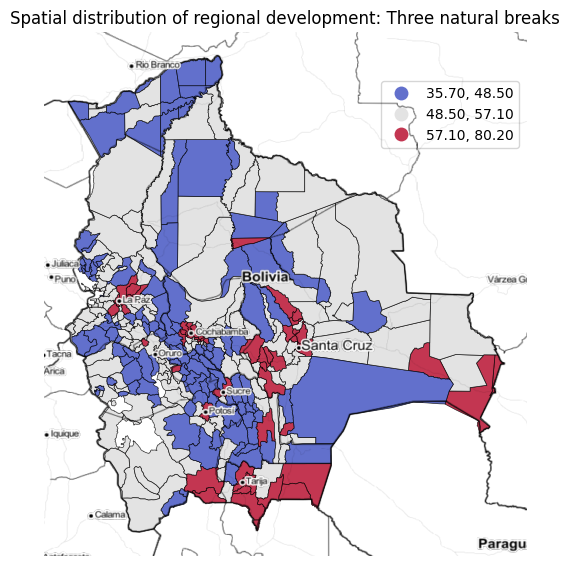

In [399]:
import contextily as cx

# Create a figure and axis for plotting
fig, ax = plt.subplots(figsize=(9, 6))

# Plot the GeoDataFrame with specified settings
gdf.plot(
    column=INDICATOR1,              # Data for coloring
    scheme='FisherJenks',           # Classification scheme
    k=3,                            # Number of classes for coloring
    cmap='coolwarm',                # Color map for visualization
    edgecolor='k',                  # Color of edges
    linewidth=0.5,                  # Width of edge lines
    alpha=0.8,                      # Transparency
    legend=True,                    # Show legend
    ax=ax,                          # Specify the axis for plotting
    legend_kwds={'bbox_to_anchor': (1.00, 0.92)}  # Legend customization
)

# Adding a basemap using contextily
cx.add_basemap(
    ax,                             # Axis to add basemap to
    crs=gdf.crs.to_string(),         # Coordinate reference system
    source=cx.providers.Stamen.TonerHybrid,  # Basemap source
    attribution=False               # Disable attribution
)

# Set plot title and adjust layout
plt.title('Spatial distribution of regional development: Three natural breaks')
plt.tight_layout()

# Turn off axis display
ax.axis("off")

# Display the plot
plt.show()


### 5.2) Spatial dependence

- To what extent is the performance of a region similar to that of its neighbours?
- To what extent is there is an overall pattern of "clustering"?
- Where can we find statistically significant spatial clusters?
- Where can we find statistically significant spatial outliers?

(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

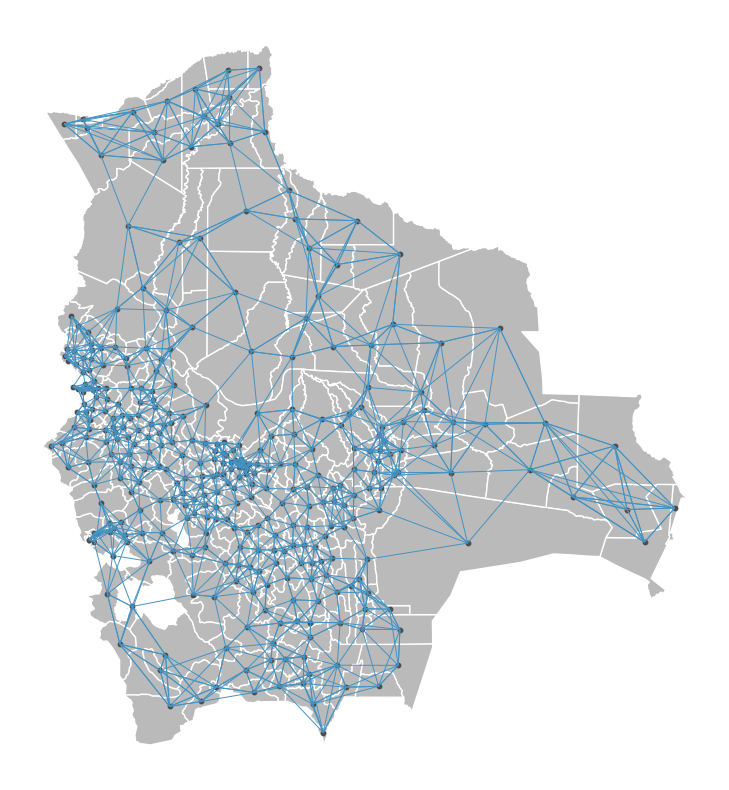

In [400]:
# Create K-nearest neighbors spatial weights
W = weights.KNN.from_dataframe(gdf, k=6)

# Transform the weights to row-standardized
W.transform = 'r'

# Plot the spatial weights using splot
plot_spatial_weights(W, gdf)

In [401]:
# List of columns to select from the GeoDataFrame
myLIST = ['asdf_id', 'mun', 'dep', 'dep_mun', INDICATOR1]
# Create a new DataFrame with selected columns
df_MORAN = gdf[myLIST]
# Calculate spatial lag of INDICATOR1 using the specified weights
df_MORAN["WxINDICATOR1"] = weights.lag_spatial(W, df_MORAN.iloc[: , -1])

In [402]:
# Creating a scatter plot with Plotly Express
px.scatter(
    df_MORAN,
    x=INDICATOR1,                            # Data for x-axis
    y="WxINDICATOR1",                        # Data for y-axis
    hover_name="mun",                        # Municipality for hover tooltip
    hover_data=['dep', INDICATOR1, 'WxINDICATOR1'],  # Additional data for hover tooltip
    trendline="ols",                         # Adding OLS trendline
    marginal_x="box",                        # Display marginal box plot on x-axis
    marginal_y="box",                        # Display marginal box plot on y-axis
    labels=dict(
        imds='Development index',             # Label for y-axis
        WxINDICATOR1='Development index in neighboring regions',  # Label for x-axis
        rank_imds='Development ranking',      # Label for hover data
        mun='Municipality',                   # Label for hover data
        dep='Department'                      # Label for hover data
    )
)


In [403]:
# Calculate global Moran's I
globalMoran = Moran(gdf[INDICATOR1], W)
MoranI = globalMoran.I
MoranI = "{:.2f}".format(MoranI)

# Calculate local indicators of spatial association
localMoran = Moran_Local(gdf[INDICATOR1], W, permutations = 999, seed=12345)

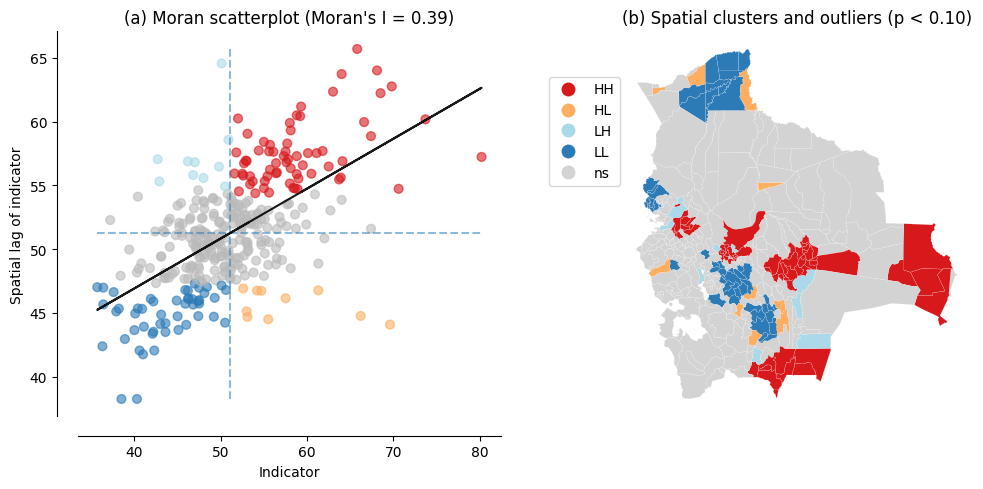

In [404]:
# Create subplots for visualizations
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))

# Plotting Moran scatterplot
moran_scatterplot(localMoran, p=0.10, aspect_equal=False, zstandard=False, ax=axes[0])

# Plotting Local Indicators of Spatial Association (LISA) clusters
lisa_cluster(localMoran, gdf, p=0.10, legend_kwds={'bbox_to_anchor': (0.02, 0.90)}, ax=axes[1])

# Setting labels and titles for the plots
axes[0].set_xlabel('Indicator')
axes[0].set_ylabel('Spatial lag of indicator')
axes[0].set_title(f"(a) Moran scatterplot (Moran's I = {MoranI})")
axes[1].set_title("(b) Spatial clusters and outliers (p < 0.10)")

# Display the plots
plt.show()

### 5.3) Spatial inequality

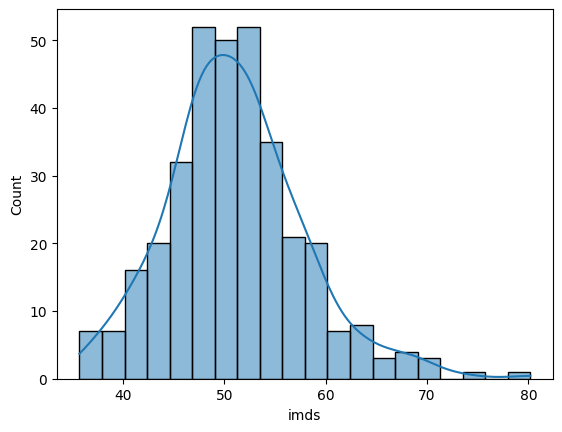

In [405]:
# Create a histogram plot using Seaborn
sns.histplot(x=gdf[INDICATOR1], kde=True);

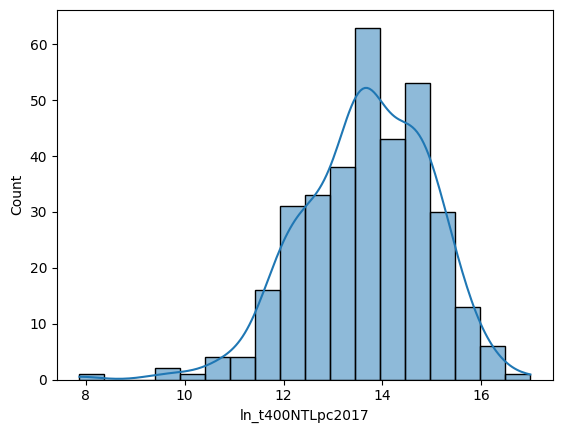

In [406]:
# Create a histogram plot using Seaborn
sns.histplot(x=gdf[INDICATOR3], kde=True);

The Theil index

In [407]:
theil_INDICATOR1 = inequality.theil.Theil(gdf[INDICATOR1].values).T
theil_INDICATOR1

0.008639875162700268

In [408]:
theil_INDICATOR3 = inequality.theil.Theil(gdf[INDICATOR3].values).T
theil_INDICATOR3

0.004464226831497372

Theil index decomposition

In [476]:
# Exploring data using the explore() function on the GeoDataFrame
gdf.explore(
    column='dep',                        # Column to visualize
    tooltip=['dep', 'mun', 'imds', 'rank_imds'],  # Information in tooltip
    categorical=True,                    # Categorical column
    legend=True,                         # Show legend
    tiles='CartoDB positron',            # Basemap style
    style_kwds=dict(color="gray", weight=0.6),  # Styling for non-highlighted areas
    legend_kwds=dict(colorbar=False)     # Customize legend

)


In [410]:
theil_BW_INDICATOR1 = inequality.theil.TheilD(gdf[INDICATOR1].values, gdf['dep'])

In [411]:
theil_B_INDICATOR1 = theil_BW_INDICATOR1.bg
theil_W_INDICATOR1 = theil_BW_INDICATOR1.wg

In [412]:
theil_B_INDICATOR1/theil_INDICATOR1

array([0.19531886])

In [413]:
theil_W_INDICATOR1/theil_INDICATOR1

array([0.80468114])

In [414]:
theil_BW_INDICATOR3 = inequality.theil.TheilD(gdf[INDICATOR3].values, gdf['dep'])

In [415]:
theil_B_INDICATOR3 = theil_BW_INDICATOR3.bg
theil_W_INDICATOR3 = theil_BW_INDICATOR3.wg

In [416]:
theil_B_INDICATOR3/theil_INDICATOR3

array([0.18629574])

In [417]:
theil_W_INDICATOR3/theil_INDICATOR3

array([0.81370426])

Let's compute the standard gini index

In [418]:
inequality.gini.Gini(gdf[INDICATOR1].values).g

0.07282132196446878

In [419]:
inequality.gini.Gini(gdf[INDICATOR3].values).g

0.0521407680211148

Let's compute the spatial gini index

In [420]:
Gini_Spatial(gdf[INDICATOR1], W).wcg_share

0.07185407731996797

In [421]:
Gini_Spatial(gdf[INDICATOR1], W).p_sim

0.01

In [422]:
Gini_Spatial(gdf[INDICATOR3], W).wcg_share

0.0514693370418708

In [423]:
Gini_Spatial(gdf[INDICATOR3], W).p_sim

0.01

### 5.4) Spatial heterogeneity

In [424]:
# Reshape the data for GWR regression
y = gdf[INDICATOR1].values.reshape((-1,1))
x = gdf[INDICATOR3].values.reshape((-1,1))

In [425]:
# Create coordinate pairs
u = gdf['COORD_X']
v = gdf['COORD_Y']
coords = list(zip(u,v))

In [426]:
# Perform bandwidth selection for Geographically Weighted Regression (GWR)
gwr_selector = Sel_BW(coords, y, x, spherical = True)
gwr_bw = gwr_selector.search(criterion='AICc')

In [427]:
print('GWR bandwidth =', gwr_bw)

GWR bandwidth = 46.0


In [428]:
# Perform Geographically Weighted Regression (GWR) and get results
gwr_results = GWR(coords, y, x, gwr_bw).fit()

# Display summary of GWR results
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                 339
Number of covariates:                                                     2

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                          10221.458
Log-likelihood:                                                   -1058.379
AIC:                                                               2120.757
AICc:                                                              2122.829
BIC:                                                               8258.096
R2:                                                                   0.341
Adj. R2:                                                              0.339

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

In [429]:
# As reference, here is the (mean) R2, AIC, and AICc
print('Mean R2 =', gwr_results.R2)
print('AIC =',     gwr_results.aic)
print('AICc =',    gwr_results.aicc)

Mean R2 = 0.6040381097677936
AIC = 2021.188267111759
AICc = 2031.4418021891354


In [430]:
# Add R2 to GeoDataframe
gdf['gwr_R2'] = gwr_results.localR2

In [431]:
# Visualizing local R-squared using the explore() function
gdf.explore(
    column='gwr_R2',                   # Column to visualize
    tooltip=['dep', 'mun', 'gwr_R2',   # Information to show in tooltip
             'rank_imds', INDICATOR1, INDICATOR3],  # Additional attributes
    k=5,                               # Number of classes for visualization
    scheme='FisherJenks',              # Classification scheme
    cmap='coolwarm',                   # Color map for visualization
    legend=True,                       # Show legend
    tiles='CartoDB dark_matter',       # Basemap style
    style_kwds=dict(color="gray", weight=0.4),  # Styling for non-highlighted areas
    legend_kwds=dict(colorbar=False)   # Legend customization
)


In [432]:
# Add coefficients to data frame
gdf['gwr_intercept'] = gwr_results.params[:,0]
gdf['gwr_slope']     = gwr_results.params[:,1]

In [433]:
# Filter t-values: standard alpha = 0.05
gwr_filtered_t = gwr_results.filter_tvals(alpha = 0.05)

In [434]:
# Filter t-values: corrected alpha due to multiple testing
gwr_filtered_tc = gwr_results.filter_tvals()

In [435]:
# Slope heterogeneity exploration using geopandas' explore() function
gdf.explore(
    column='gwr_slope',                   # Column to visualize
    tooltip=['dep', 'mun', 'gwr_slope',   # Information to show in tooltip
             'rank_imds', INDICATOR1, INDICATOR3],  # Additional attributes
    k=5,                                  # Number of classes for visualization
    scheme='FisherJenks',                 # Classification scheme
    cmap='coolwarm',                      # Color map for visualization
    legend=True,                          # Show legend
    tiles='CartoDB dark_matter',          # Basemap style
    style_kwds=dict(color="gray", weight=0.4),  # Styling for non-highlighted areas
    legend_kwds=dict(colorbar=False)      # Legend customization
)


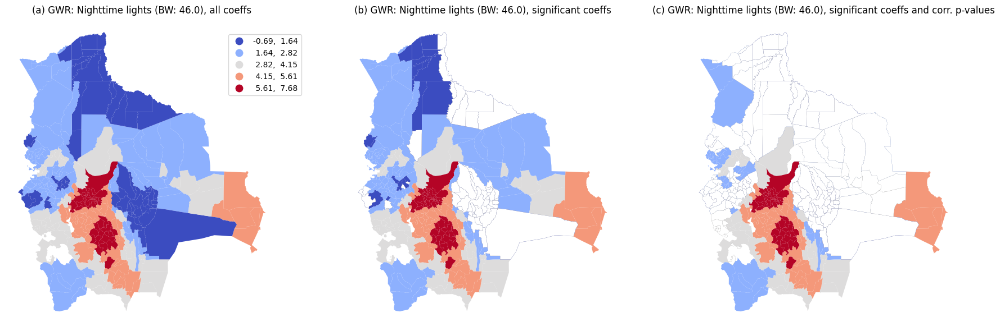

In [436]:
# Create subplots for visualizations
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))

# Plotting the first map
gdf.plot(column='gwr_slope', cmap='coolwarm', linewidth=0.01, scheme='FisherJenks', k=5,
         legend=True, legend_kwds={'bbox_to_anchor': (1.10, 0.96)}, ax=axes[0])
axes[0].set_title('(a) GWR: Nighttime lights (BW: ' + str(gwr_bw) + '), all coeffs', fontsize=12)
axes[0].axis("off")

# Plotting the second map
gdf.plot(column='gwr_slope', cmap='coolwarm', linewidth=0.05, scheme='FisherJenks', k=5,
         legend=False, legend_kwds={'bbox_to_anchor': (1.10, 0.96)}, ax=axes[1])
gdf[gwr_filtered_t[:, 1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[1])
axes[1].set_title('(b) GWR: Nighttime lights (BW: ' + str(gwr_bw) + '), significant coeffs', fontsize=12)
axes[1].axis("off")

# Plotting the third map
gdf.plot(column='gwr_slope', cmap='coolwarm', linewidth=0.05, scheme='FisherJenks', k=5,
         legend=False, legend_kwds={'bbox_to_anchor': (1.10, 0.96)}, ax=axes[2])
gdf[gwr_filtered_tc[:, 1] == 0].plot(color='white', linewidth=0.05, edgecolor='black', ax=axes[2])
axes[2].set_title('(c) GWR: Nighttime lights (BW: ' + str(gwr_bw) + '), significant coeffs and corr. p-values', fontsize=12)
axes[2].axis("off")

# Adjust layout and display the plots
plt.tight_layout()
plt.show()
